In [ ]:
import pandas as pd
import numpy as np
import random as rnd
import matplotlib.pyplot as plt
import time
import seaborn as sns
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib.animation import FuncAnimation



df = pd.read_csv('/content/world food production.csv')
df.head()


,Entity,Year,Maize Production (tonnes),Rice Production ( tonnes),Yams Production (tonnes),Wheat Production (tonnes),Tomatoes Production (tonnes),Tea Production ( tonnes ),Sweet potatoes Production (tonnes),Sunflower seed Production (tonnes),...,Oranges Production (tonnes),"Peas, dry Production ( tonnes)",Palm oil Production (tonnes),Grapes Production (tonnes),"Coffee, green Production ( tonnes)",Cocoa beans Production (tonnes),"Meat, chicken Production (tonnes)",Bananas Production ( tonnes),Avocados Production (tonnes),Apples Production (tonnes)
0,Afghanistan,1961,700000.0,319000.0,7467702.0,2279000.0,1873812.0,56315.0,3270871.0,12000.0,...,10100.0,232910.0,1131882.0,225000.0,870970.0,835368.0,5600.0,3139079.0,63439.0,15100.0
1,Afghanistan,1962,700000.0,319000.0,7420515.0,2279000.0,2044797.0,61519.0,3562524.0,12800.0,...,10100.0,259412.0,1111006.0,225000.0,883512.0,867170.0,6000.0,3181580.0,65118.0,15100.0
2,Afghanistan,1963,713000.0,319000.0,8479074.0,1947000.0,2096077.0,63596.0,3409916.0,12800.0,...,10100.0,251529.0,1145004.0,225000.0,996674.0,922621.0,6160.0,3304256.0,61760.0,15100.0
3,Afghanistan,1964,720000.0,380000.0,9113779.0,2230000.0,2388264.0,66604.0,3229336.0,12800.0,...,12400.0,247556.0,1160831.0,265000.0,1162048.0,1190061.0,6400.0,3392527.0,62759.0,18400.0
4,Afghanistan,1965,720000.0,380000.0,10067913.0,2282000.0,2559608.0,72418.0,3169104.0,13200.0,...,13700.0,266947.0,1138860.0,287000.0,1075084.0,874245.0,6800.0,3450849.0,66269.0,20400.0


This dataset contains data of total production of different types of foods in per year in each country from 1961-2023 of all country..The dataset comprises records from several major agriculture countries, producing crops like maize,rice,rice,potatoes,oranges,tomatoes,tea,coffee and many more.The amount of a specific crop produced by each country is been showed in this dataset and every value given in this dataset is in tonnes.


In [ ]:
# Grouping by year and summing global sales
global_production_by_year = df.groupby('Year')['Maize Production (tonnes)'].sum()

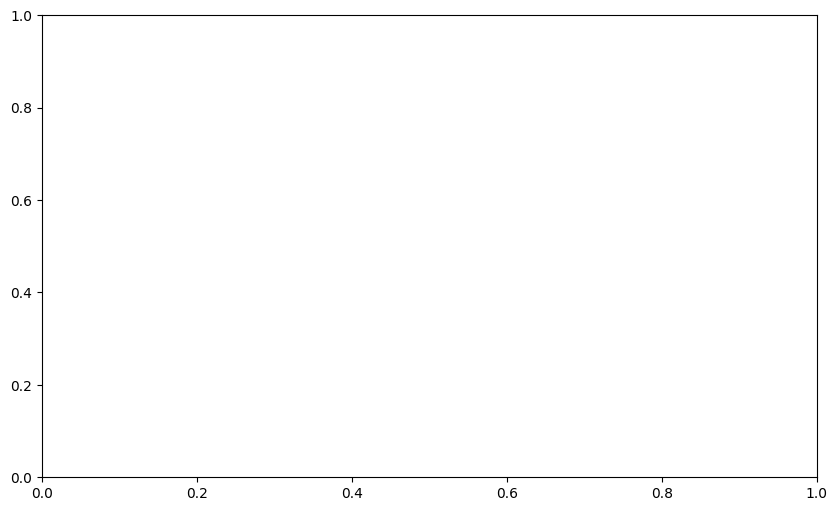

In [ ]:
# Create a figure for the animation
fig, ax = plt.subplots(figsize=(10, 6))

In [ ]:
# Set the title and labels
ax.set_title('Global maize production Over Years')
ax.set_xlabel('Year')
ax.set_ylabel('Total production (tonnes)')
ax.set_xlim(df['Year'].min(), df['Year'].max())
ax.set_ylim(0, global_production_by_year.max() + 10)

line, = ax.plot([], [], label='Global production', color='blue')

In [ ]:
# Initialize the line plot
def init():
    line.set_data([], [])
    return line,

# Animation update function
def animate(year):
    x = global_production_by_year.loc[:year].index
    y = global_production_by_year.loc[:year].values
    line.set_data(x, y)
    return line,

In [ ]:
# Create the animation
years = np.arange(df['Year'].min(), df['Year'].max() + 1)
ani = FuncAnimation(fig, animate, init_func=init, frames=years, interval=500, blit=True)

In [ ]:
# Display the animation in the notebook
HTML(ani.to_html5_video())

Maize being one of the finest food option among other major food materials is extensively grown and produced.Because of its worldwide distribution and relatively lower price maize has wider range of uses. It is used directly for human consumption, in industrially processing foods, as Live-stock feed and in industrially non food products such as starches, acids and alcohols.This can be showed in this plot which defines how the production of maize has increased year on year from 1961 to 2021.

This provides an interactive way to visualize and analyze the temporal evolution of global production. The animation allows for a dynamic exploration of trends and patterns over time, offering insights into the overall trajectory of the data.

Temporal Trends: Analyzing how global production changes over the years. Identifying periods of growth, decline, or stability.
Outlier Detection: Looking for years where there are significant deviations from the general trend in global production.
Rate of Change: Observing the speed at which global production is changing by examining the slope of the line.
Data Completeness: Considering gaps or irregularities in the line plot, which may indicate missing or incomplete data for certain years.


In [ ]:
from collections import defaultdict
from IPython.display import clear_output

def live_plot(data_dict, figsize=(7,5), title=''):
    clear_output(wait=True)
    plt.figure(figsize=figsize)
    for label,data in data_dict.items():
        plt.plot(data, label=label)
    plt.title(title)
    plt.grid(True)
    plt.xlabel(f'Year')
    plt.legend(loc='center left')
    plt.show();

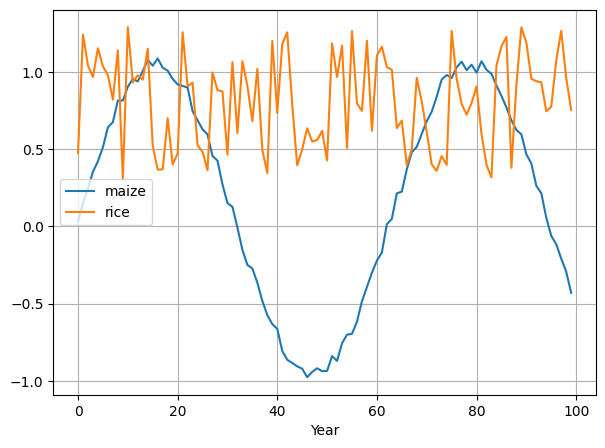

In [ ]:
data = defaultdict(list)

for i in range(100):
    data['maize'].append(np.sin(i/10) + 0.1*np.random.random())
    data['rice'].append(np.random.random()+0.3)
    live_plot(data)

 live plotting of 'maize' and 'rice' production over time , providing a dynamic visualization of how the data evolves. Maize and Rice are major food component worldwide.Almost more half of the world consumes these food articles and comparing their production since 1961 shows that production of rice is far ahead than maize because may be of its high high demand worldwide and more favourable conditions available naturally which help to cultivate them .

 This provides a convenient way to visualize and analyze evolving data trends. Its use cases could range from monitoring ongoing experiments to observing dynamic patterns in various domains.












In [ ]:
# Grouping by year and summing sales by region
crop_production_by_year = df.groupby('Year')[['Yams  Production (tonnes)', 'Wheat Production (tonnes)', 'Tomatoes Production (tonnes)', 'Tea  Production ( tonnes )','Sweet potatoes  Production (tonnes)','Sunflower seed  Production (tonnes)']].sum()

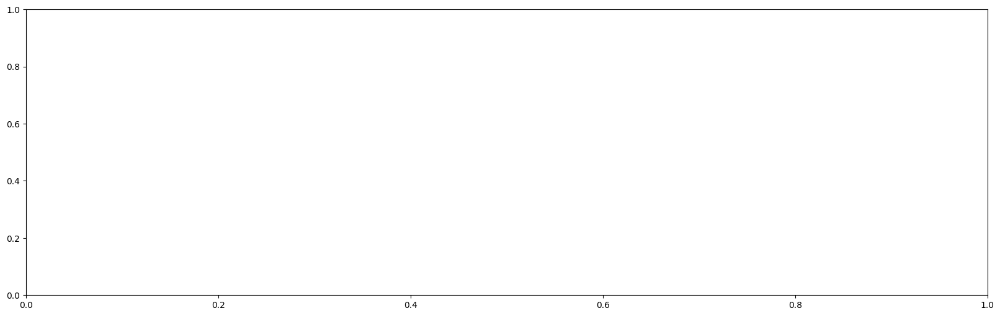

In [ ]:
# Initialize the figure for animation
fig, ax = plt.subplots(figsize=(20, 6))

In [ ]:
def animate(year):
    ax.clear()
    prod_data = crop_production_by_year.loc[year]
    crop = ['Yams  Production (tonnes)', 'Wheat Production (tonnes)', 'Tomatoes Production (tonnes)', 'Tea  Production ( tonnes )','Sweet potatoes  Production (tonnes)','Sunflower seed  Production (tonnes)']
    ax.bar(crop, prod_data, color=plt.cm.Set2(np.arange(len(crop))))
    ax.set_title(f'crop production in {year}')
    ax.set_xlabel('crop')
    ax.set_ylabel('Total production (tonnes)')

# Create the animation
years = crop_production_by_year.index
ani = FuncAnimation(fig, animate, frames=years, interval=2000)

In [ ]:
# To display the animation
HTML(ani.to_html5_video())

The animation will display a dynamic bar chart that iterates through different years, showing how the production of various crops changes over time.
The height of each bar represents the total production of a specific crop in a given year.
Trends in crop production over the years can be visually analyzed. For example, are there any crops with consistently increasing or decreasing production? Are there particular years that stand out in terms of overall production?
Comparisons between different crops can be made, identifying which crops contribute more significantly to total production in specific years.
Anomalies or irregularities in crop production can be spotted, leading to further investigation into potential factors influencing these fluctuations.
It could be easily inferred from the graph that wheat is largely produced among these produced crops.


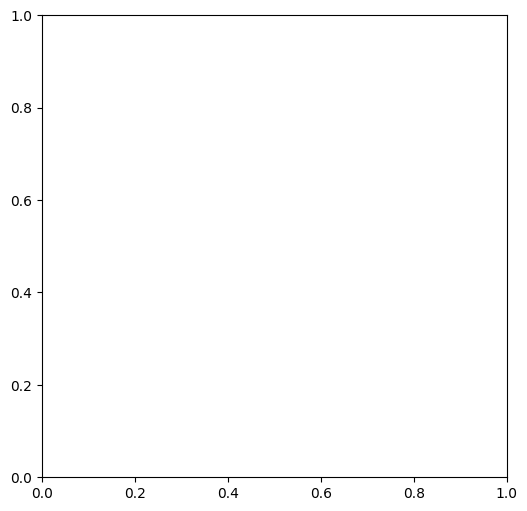

In [ ]:
# List of years to iterate over
years = sorted(df['Year'].unique())

# Initialize the figure for animation
fig, ax = plt.subplots(figsize=(6, 6))

In [ ]:
def animate(year):
        ax.clear()
        # Filter data for the current year
        data_year = df[df['Year'] == year]['Bananas  Production ( tonnes)']
        # Create a box plot
        ax.boxplot(data_year, vert=False, patch_artist=True)
        ax.set_title(f'Global banana production in {year}')
        ax.set_xlabel('Global production (tonnes)')
        ax.set_ylabel('production')

# Create the animation
ani = FuncAnimation(fig, animate, frames=years, interval=1000)

# To display the animation
HTML(ani.to_html5_video())

Bananas have a particular significance in some of the least developed and low income food‑deficit countries, where they contribute not only to household food security as a staple but also to income generation as a cash crop.    
         The animation will show a series of box plots, each representing the distribution of global banana production for a specific year.
Variability in the box plots can indicate changes in the distribution of banana production over the specified years.
Outliers in the box plots might represent exceptional years with significantly higher or lower banana production.
Trends or patterns in the box plots could provide insights into the overall behavior of global banana production over time.

Identify and analyze trends: Looking for trends or patterns in the distribution of global banana production over the years.
Identify outliers: Exploring years with unusually high or low banana production and investigating potential causes or events.
Assess distribution characteristics: Examining the spread and central tendency of banana production for each year.
Correlation with external factors: Analyzing whether banana production correlates with external factors such as weather conditions, economic indicators, or disease outbreaks.



In [ ]:
# Grouping by year and platform, then summing global sales
countrywise_by_year = df.groupby(['Year', 'Entity'])['Oranges  Production (tonnes)'].sum().unstack().fillna(0)

In [ ]:
def animate(year):
    ax.clear()
    sales_data =countrywise_by_year.loc[year]
    country = sales_data.index
    production = sales_data.values
    ax.bar(country, production, color=plt.cm.viridis(np.linspace(0, 1, len(country))))
    ax.set_title(f'Global orange production by country in {year}')
    ax.set_xlabel('country')
    ax.set_ylabel('Total production (tonnes)')
    ax.set_xticklabels(country, rotation=45, ha='right')

# Create the animation
years = countrywise_by_year.index
ani = FuncAnimation(fig, animate, frames=years, interval=2000)

In [ ]:
# To display the animation
HTML(ani.to_jshtml())

<ipython-input-92-b1b864a749fe>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(country, rotation=45, ha='right')


  The animation will display a series of bar charts, each representing the total orange production for different countries in a specific year.
Changes in the length and color of the bars over time can reveal trends, variations, or patterns in global orange production by country.

This provides a dynamic visualization of the evolution of global orange production by country, allowing for the exploration of patterns and changes in the data over the specified time period.

Identify leading producers:we can Observe some countries consistently have high orange production and how their rankings change over the years.
Spot trends and variations: Analyzing the animation for trends or variations in orange production across different countries.
Seasonal or cyclical patterns: Looking for recurring patterns in production that might be linked to seasonal or cyclical factors.
Comparative analysis: Comparing the production levels of specific countries or regions over time.

In [ ]:
import plotly.express as px
#crop production by countries
animated_crop_plot = px.scatter(df, x='Year', y='Entity', animation_frame='Grapes  Production (tonnes)',
                                  title='cocoa bean production',
                                  labels={'Entity': 'Entity ($)', 'Year': 'Year', 'Grapes  Production (tonnes)': 'Cocoa beans Production (tonnes)'},
                                  range_y=[df['Entity'].min(), df['Entity'].max()])

# Increase the duration of each frame
animated_crop_plot.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000  # 1000 milliseconds per frame

animated_crop_plot.show()

This facilitates an interactive exploration of cocoa bean production dynamics over time, enabling users to visually analyze patterns, variations, and relationships among different entities.

The animated scatter plot will show markers (representing entities) moving across the x-axis (years) based on cocoa bean production.
Entities with higher cocoa bean production will have larger markers, and changes in marker size over time may indicate trends or fluctuations in production.

Temporal Trends: Observing how cocoa bean production evolves over the years for different entities. Identifing periods of growth, decline, or stability.
Entity Comparison: Comparing the production levels and trends of different entities. Identifying top producers and explore how their contributions change over time.
Outlier Detection: Looking for entities that stand out in terms of unusually high or low cocoa bean production in specific years.
Categorical Analysis: Exploring the distribution of cocoa bean production among different entities. Identifing clusters or patterns in the scatter plot.
Correlation with External Factors: Considering external factors such as weather conditions, economic indicators, or agricultural policies that might influence cocoa bean production trends.

In [ ]:
# Animated plot for Potatoes vs. Oranges Production across year
animated_pot_oran_plot = px.scatter(df, x='Potatoes  Production (tonnes)', y='Oranges  Production (tonnes)', animation_frame='Year',
                                       title='potaoes and oranges in each year',
                                       labels={'Oranges  Production (tonnes)': 'Oranges  Production (tonnes) ($)', 'Potatoes  Production (tonnes)': 'Potatoes  Production (tonnes)', 'Year': 'Year'},
                                       range_y=[df['Oranges  Production (tonnes)'].min(), df['Oranges  Production (tonnes)'].max()])
# Increase the duration of each frame
animated_pot_oran_plot.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000  # 1000 milliseconds per frame

animated_pot_oran_plot.show()

This provides an interactive way to explore the relationship between potato and orange production, allowing for a dynamic analysis of trends and patterns over time. Users can visually identify correlations, outliers, and changes in the production dynamics of these two crops.

The animated scatter plot will show markers (representing each data point) moving across the plot area based on both potato and orange production.
Patterns or trends in the movement of the markers may suggest correlations, relationships, or changes in the production levels of potatoes and oranges over time.

Correlation Analysis: Observing how potato and orange production levels correlate over time. Looking for patterns in the scatter plot, such as linear relationships or clusters of data points.
Outlier Detection: Identifying years where there are significant deviations from the general trend in potato and orange production.
Temporal Changes: Analyzing how the relative proportions of potato and orange production change over the years.
Comparative Analysis: Comparing the overall trends in potato and orange production. Identify periods where one crop outperforms the other.

In [ ]:
# countries wise apple production year on year
animated_apple_production_plot = px.bar(df[df['Apples Production (tonnes)'] == 1], x='Entity', animation_frame='Year',
                                           title='countries wise apple production year on year',
                                           color='Entity')
# Check if updatemenus list is not empty
if animated_apple_production_plot.layout.updatemenus:
    # Check if buttons list is not empty
    if animated_apple_production_plot.layout.updatemenus[0].buttons:
        # Update frame duration
        animated_apple_production_plot.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 2000

animated_apple_production_plot.show()


This facilitates an interactive exploration of apple production dynamics by country over time. It allows for dynamic analysis, helping users identify trends and variations in apple production and compare the contributions of different countries.

The animated bar chart will show bars (representing different countries) appearing and disappearing over the years, indicating changes in apple production for each country.
Color variations will help distinguish between different countries, and the animation provides a dynamic representation of apple production trends.

Temporal Trends: Observing how apple production in different countries changes over the years. Identifying years of increased or decreased production.
Top Producers: Identifying countries that consistently appear as top producers of apples over multiple years.
Comparative Analysis: Comparing the production levels of different countries in the same year. Look for patterns or outliers.
Seasonal Patterns: Observing if there are seasonal patterns in apple production for specific countries.
Missing Data: Checking for gaps in the animation, which may indicate missing or incomplete data for certain years or countries.